## Welcome!

See details about this project [here](https://mallorywittwer.github.io/)! This is a demo notebook to the texture classification and parameter estimation problem. The notebook is broadly organized as follows:

0. Basic set-up
1. Texture classification via CNN
2. Texture structural parameter estimation via 2-points correlations
3. Texture base colors estimation via K-Means + linear model
4. Predictions on rendered materials
5. Predictions on real materials

In [8]:
import os
import time
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
import piexif
import piexif.helper
import json
import glob
import seaborn as sns
import pandas as pd
from sklearn.metrics import confusion_matrix
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

from pymks import (
    PrimitiveTransformer,
    TwoPointCorrelation,
)

import warnings
warnings.filterwarnings('ignore')

def read_metaImage(root):
    '''Reads metadata embedded in a JPG file.'''
    exif_dict = piexif.load(root)
    user_comment = piexif.helper.UserComment.load(exif_dict["Exif"][piexif.ExifIFD.UserComment])
    d = json.loads(user_comment)
    return d

# Where to look for and save data / models
training_root = os.path.abspath(os.path.join(os.getcwd(), f'renders/training/*.jpg'))
validation_root = os.path.abspath(os.path.join(os.getcwd(), f'renders/validation/*.jpg'))
test_root = os.path.abspath(os.path.join(os.getcwd(), f'renders/test/*.jpg'))
real_root = os.path.abspath(os.path.join(os.getcwd(), f'renders/real/*.jpg'))

## Data generators

These data generators inherit from tf.keras.utils.Sequence; they are custom-built for the tasks at hand.

In [9]:
class BaseGenerator(tf.keras.utils.Sequence):
    '''
    A basic data generator yielding X-y pairs.
    '''
    def __init__(self, X, y, batch_size=50):
        self.bs = batch_size
        self.X = X
        self.y = y
        self.n = len(X)
    
    def __len__(self):
        return int(np.floor(self.n/self.bs))
    
    def __getitem__(self, idx):
        X_batch = self.X[idx*self.bs:(idx+1)*self.bs]
        y_batch = self.y[idx*self.bs:(idx+1)*self.bs]
        return X_batch, y_batch

class MultiDataGenerator(tf.keras.utils.Sequence):
    '''
    Has an argument "subset" that enables to yield only a single texture class (for ex. "Brick").
    '''
    def __init__(self, root, batch_size=50, subset=None, res=(150,150)):
        self.d = {'Brick':[0,1], 'Checker':[1,1], 'Magic':[2,2], 'Noise':[3,2], 'Wave':[4,2]}
        self.root = root
        self.bs = batch_size
        self.rx, self.ry = res
        self.files = glob.glob(root)
        self.n = len(self.files)
        if subset:
            filt = np.array(self._get_class_names()) == subset
            self.files = np.array(self.files)[filt]
            self.n = len(self.files)
        self.subset = subset
        print(f'Initialized data generator. Found {self.n} files.')
    
    def __len__(self):
        return int(np.floor(self.n/self.bs))
    
    def __getitem__(self, idx):
        batch = self.files[idx*self.bs:(idx+1)*self.bs]
        X, y = self._data_generation(batch)
        return X, y
    
    def _data_generation(self, batch):
        data = np.empty((len(batch), self.rx, self.ry, 3), dtype=np.uint8)
        
        if self.subset:
            labels = np.empty((len(batch), self.d[self.subset][1]), dtype=np.float32)
        else:
            labels = np.empty(len(batch), dtype=np.uint8)
        
        for k, file in enumerate(batch):
            data[k] = np.array(Image.open(file), dtype=np.uint8)
            
            if self.subset:       
                labels[k] = list(read_metaImage(file).get('texture_params').values())[0]
            else:
                vals = list(read_metaImage(file).get('texture_params').keys())[0]
                labels[k] = self.d[vals][0]
                
        return data, labels   
    
    def _get_class_names(self):
        class_names = []
        for file in self.files:
            class_names.append(list(read_metaImage(file).get('texture_params').keys())[0])
        return class_names
    
class RealImagesGenerator(tf.keras.utils.Sequence):
    '''
    Used to yield "real" pictures of materials that aren't labeled.
    '''
    def __init__(self, root, res=(150,150)):
        self.d = {'Brick':[0,7], 'Checker':[1,7], 'Magic':[2,8], 'Noise':[3,8], 'Wave':[4,8]}
        self.root = root
        self.bs = 1
        self.rx, self.ry = res
        self.files = glob.glob(root)
        self.n = len(self.files)
        print(f'Initialized data generator. Found {self.n} files.')
    
    def __len__(self):
        return int(np.floor(self.n/self.bs))
    
    def __getitem__(self, idx):
        batch = self.files[idx*self.bs:(idx+1)*self.bs]
        X = self._data_generation(batch)
        return X
    
    def _data_generation(self, batch):
        data = np.empty((len(batch), self.rx, self.ry, 3), dtype=np.uint8)
        for k, file in enumerate(batch):
            data[k] = np.array(Image.open(file), dtype=np.uint8)     
        return data

## Base model template

In [10]:
class BaseModelTemplate():
    '''
    Provides basic model functions (fit, evaluate, predict, reload) and an automated learning rate optimizer.
    '''    
    def fit(self, training_dataset, validation_dataset, patience=None, epochs=1, save_it=False):
        '''
        If patience is an INT, training will stop after patience level. Otherwise after epochs.
        '''
        callbacks = []
        
        if patience is not None:
            early_stopping = tf.keras.callbacks.EarlyStopping(
                monitor='val_loss', patience=patience)
            callbacks.append(early_stopping)
        
        if save_it:
            cp_callback = tf.keras.callbacks.ModelCheckpoint(
                filepath=save_it,
                save_weights_only=True, verbose=1)
            callbacks.append(cp_callback)
        
        self.history = self.model.fit(
            training_dataset,
            epochs=epochs,
            verbose=1,
            validation_data=validation_dataset,
            callbacks=callbacks,
        )
        
        fig, ax = plt.subplots(figsize=(16,6))
        for metric, values in self.history.history.items():
            ax.plot(values, label=metric)   
        ax.set_ylim(bottom=0)
        plt.legend()
        plt.show()

        self.total_epochs = len(self.history.history['loss'])
        print('FINISHED - TOTAL EPOCHS: ', self.total_epochs)
        
    def predict(self, dataset):
        return self.model.predict(dataset)
    
    def evaluate(self, dataset):
        return self.model.evaluate(dataset)
    
    def run_lr_scheduler(self, training_dataset, validation_dataset):
        '''
        Learning rate optimization between 1e-5 and 1e-2 over 40 epochs.
        '''
        model = self.model
        
        lr_scheduler = tf.keras.callbacks.LearningRateScheduler(
            lambda epoch: 1e-5 * 10**(epoch / 10))
        
        history = model.fit(
            training_dataset,
            epochs=40,
            verbose=1,
            validation_data=validation_dataset,
            callbacks = [lr_scheduler],
        )
        
        lrs = history.history["lr"]
        losses = history.history["loss"]
        optimal_lr = lrs[np.argmin(losses)]
        
        fig, ax = plt.subplots(figsize=(8,6), dpi=200)
        ax.semilogx(lrs, losses)
        ax.set_xlabel('learning rate')
        ax.set_ylabel('loss')
        ax.set_title('Optimal lr: {:.2e}'.format(optimal_lr))
        plt.show()
        
        self.create_model()
        
        return optimal_lr
    
    def set_learning_rate(self, lr):
        K.set_value(self.model.optimizer.learning_rate, lr)
        print('\n> Learning rate set to: {:.2e}'.format(lr))
        self.lr = lr
        
    def reload(self, checkpoint):
        '''Reloads model weights from checkpoint.'''
        self.model.load_weights(checkpoint).expect_partial()
        print(f'\n> Reloaded model weights from: {checkpoint}') 

## 1 | Texture classification
A classical CNN workflow to detect one of five classes: Brick, Checker, Magic, Noise and Wave.

In [11]:
class TextureClassifier(BaseModelTemplate):
    '''
    Two convolutional layers with max pooling -> two dense layers.
    '''
    def create_model(self, input_shape=(150, 150, 3), n_krn=16, n_dense=64):
        init = tf.keras.initializers.GlorotUniform()
        rx, ry, _ = input_shape     
        inputs = tf.keras.Input(shape=input_shape)
        
        @tf.function
        def preprocess(x):
            x = tf.multiply(x, 1/255.0) # Rescale to 0-1
            fftx = tf.signal.dct(tf.reduce_mean(x, axis=3)) # Discrete cosine transform (projects data to frequency space)
            fftx = tf.expand_dims(fftx, -1)
            x = tf.concat((x, fftx), axis=-1)
            return x  
        
        add_dct_layer = tf.keras.layers.Lambda(lambda x:preprocess(x), output_shape=(rx, ry, 3))(inputs)
        
        # CNN
        conv2d0 = tf.keras.layers.Conv2D(n_krn, (3,3), strides=(1,1), padding="same", activation='relu',
                                        kernel_regularizer=tf.keras.regularizers.l2(1e-2))(add_dct_layer)
        mpool1 = tf.keras.layers.MaxPooling2D((2,2))(conv2d0)
        conv2d1 = tf.keras.layers.Conv2D(n_krn, (3,3), strides=(1,1), padding="same", activation='relu',
                                        kernel_regularizer=tf.keras.regularizers.l2(1e-2))(mpool1)
        mpool2 = tf.keras.layers.MaxPooling2D((2,2))(conv2d1)
        flatten = tf.keras.layers.Flatten()(mpool2)
        dense0 = tf.keras.layers.Dense(n_dense, activation='relu', kernel_initializer=init,
                                      kernel_regularizer=tf.keras.regularizers.l2(1e-2))(flatten)
        dense1 = tf.keras.layers.Dense(n_dense, activation='relu', kernel_initializer=init,
                                      kernel_regularizer=tf.keras.regularizers.l2(1e-2))(dense0)
        # Classification task:
        output = tf.keras.layers.Dense(5, activation='softmax')(dense1)
        # Make a model
        self.model = tf.keras.Model(inputs=inputs, outputs=output)
        print('Created model.')
    
    def _compile(self, lr=1e-3):
        self.model.compile(
            optimizer = tf.keras.optimizers.Adam(lr),
            loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
            metrics = ['accuracy'],
        )
        print(self.model.summary())
        
    
    def plot_confusion_matrix(self, root):
        # Load all test data in one batch:
        tg = MultiDataGenerator(root, batch_size=len(glob.glob(root)))
        for data, labels in tg: 
            # Consume single batch of generator
            preds = np.argmax(texture_classifier.predict(data), axis=1)
        cm = confusion_matrix(preds, labels)
        l = ['Brick', 'Checker', 'Magic', 'Noise', 'Wave']
        df_cm = pd.DataFrame(cm, index=l, columns=l)
        fig, ax = plt.subplots(figsize=(3.5,3), dpi=200)
        sns.heatmap(df_cm, annot=True, ax=ax)
        ax.set_xlabel('Predicted')
        ax.set_ylabel('True')
        ax.set_title('Test set')
        plt.show()

##### (Option 1) Reload a saved, trained texture classifier

Created model.

> Reloaded model weights from: C:\Users\mallo\OneDrive - Nanyang Technological University\Documents\GitHub\2018_EPFL_ExtensionSchool_Capstone\checkpoints\10kExReg1e2-20ep-DCT
Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
lambda_3 (Lambda)            (None, 150, 150, 4)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 150, 150, 16)      592       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 75, 75, 16)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 75, 75, 16)        2320      
_________________________________________________________________


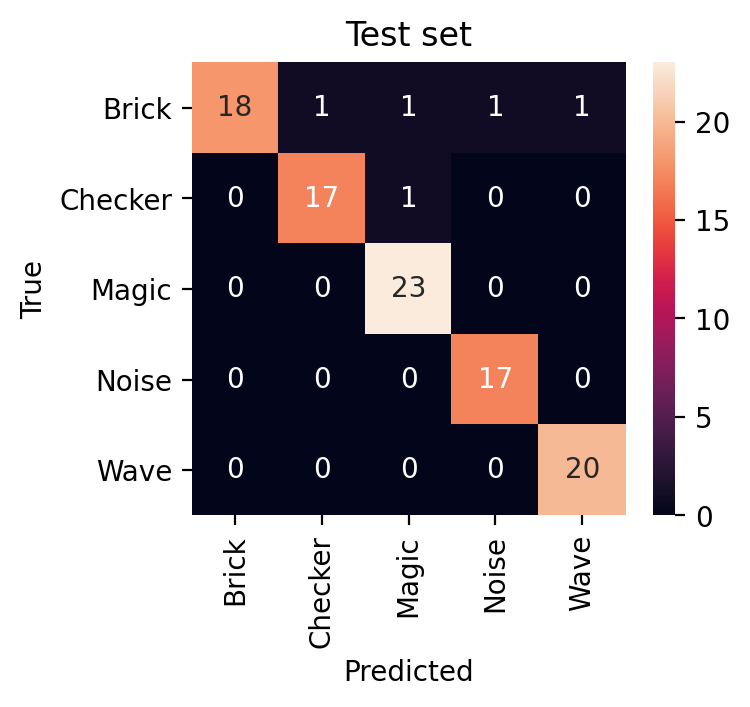

In [12]:
texture_classifier = TextureClassifier()
texture_classifier.create_model() # Create model before reloading weights
texture_classifier.reload(os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/10kExReg1e2-20ep-DCT/')))
texture_classifier._compile()

texture_classifier.plot_confusion_matrix(test_root)

##### (Option 2) Fit the classifier from scratch

In [13]:
# training_gen = MultiDataGenerator(training_root)
# validation_gen = MultiDataGenerator(validation_root)
# test_gen = MultiDataGenerator(test_root)

# texture_classifier = TextureClassifier()
# texture_classifier.create_model()
# texture_classifier._compile(lr=5e-4)

# # opti_lr = texture_classifier.run_lr_scheduler(training_gen, validation_gen)

# texture_classifier.fit(training_gen, validation_gen, patience=None, epochs=20, 
#                        save_it=os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/10kExReg1e2-20ep-DCT/')),
#                       )

# loss, accuracy = texture_classifier.evaluate(test_gen)
# print('loss / accuracy on test (texture classification): ', loss, accuracy)

## 2 | Structural texture parameter estimation
Here, we attempt to estimate the scale of the texture and its distortion level. We compute two-points correlations using the excellent [pymks](https://github.com/materialsinnovation/pymks) toolkit. We concatenate the resulting feature map to the original image. Computing the two-point correlations could be done per-batch at training time, but here I decided to pre-compute and save them beforehand; it's much faster! Pre-computed feature maps are in the **/point_correlations** folder (as .npy arrays). To check the code to produce them, refer to the **features_precomputing** notebook.

In [14]:
class TwoPtsCorrelator():
    '''
    Computes Two-points correlation feature maps.
    '''
    def __init__(self, ctf=150):
        self.preprocessor = Pipeline(steps=[
            ("discritize", PrimitiveTransformer(n_state=2, min_=0.0, max_=1.0)),
            ("correlations", TwoPointCorrelation(periodic_boundary=True, cutoff=ctf, correlations=[(0, 1), (1, 1)])),
        ])
        
    def transform(self, X):
        gray_X = np.mean(X, axis=2) / 255.0
        container = np.zeros((gray_X.shape[0], gray_X.shape[1], 2), dtype=np.float64)
        twoPts = self.preprocessor.transform(gray_X).compute()[...,0] # Has two channels (channel 2 useless)
        container[...,0] = gray_X
        container[...,1][:twoPts.shape[0], :twoPts.shape[1]] = twoPts
        return container

class ParameterEstimator(BaseModelTemplate):
    '''
    This CNN regressor estimates texture parameters. It accepts inputs as (x, y, 2)-type images, with grayscale texture as C1
    and its two-point correlation feature map as C2.
    '''
    def __init__(self):
        BaseModelTemplate.__init__(self)
        
    def create_model(self, n_outputs=1, input_shape=(150, 150, 2)):
        init=tf.keras.initializers.GlorotUniform()
        rx, ry, _ = input_shape     
        inputs = tf.keras.Input(shape=input_shape)
        conv2d0 = tf.keras.layers.Conv2D(16, (3,3), strides=(1,1), padding="same", activation='relu',
                                        kernel_regularizer=tf.keras.regularizers.l2(1e-2))(inputs)
        mpool1 = tf.keras.layers.MaxPooling2D((2,2))(conv2d0)
        conv2d1 = tf.keras.layers.Conv2D(16, (3,3), strides=(1,1), padding="same", activation='relu',
                                        kernel_regularizer=tf.keras.regularizers.l2(1e-2))(mpool1)
        mpool2 = tf.keras.layers.MaxPooling2D((2,2))(conv2d1)
        flatten = tf.keras.layers.Flatten()(mpool2)
        dense0 = tf.keras.layers.Dense(64, activation='relu', kernel_initializer=init,
                                      kernel_regularizer=tf.keras.regularizers.l2(1e-2))(flatten)
        dense1 = tf.keras.layers.Dense(64, activation='relu', kernel_initializer=init,
                                      kernel_regularizer=tf.keras.regularizers.l2(1e-2))(dense0)
        output = tf.keras.layers.Dense(n_outputs, activation=None)(dense1)
        self.model = tf.keras.Model(inputs=inputs, outputs=output)
        print('Initialized model.')

    def _compile(self, lr=1e-3):
        self.model.compile(
            optimizer = tf.keras.optimizers.Adam(lr),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics = ['mse'],
        )
        print(self.model.summary())

### Brick texture parameters

In [15]:
# Reload a trained model
brick_estimator_00 = ParameterEstimator()
brick_estimator_00.create_model(n_outputs=1)
brick_estimator_00.reload(os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/brick_model-50ep-2pts/')))
brick_estimator_00._compile()

Initialized model.

> Reloaded model weights from: C:\Users\mallo\OneDrive - Nanyang Technological University\Documents\GitHub\2018_EPFL_ExtensionSchool_Capstone\checkpoints\brick_model-50ep-2pts
Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 150, 150, 2)]     0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 150, 150, 16)      304       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 75, 75, 16)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 75, 75, 16)        2320      
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 37, 37, 16)        0         
_____________________________________________________________

In [16]:
# def get_fast_generators(subset):
#     xtr = np.load(os.path.abspath(os.path.join(os.getcwd(), f'point_correlations/{subset}/xtr.npy')))
#     ytr = np.load(os.path.abspath(os.path.join(os.getcwd(), f'point_correlations/{subset}/ytr.npy')))
#     xval = np.load(os.path.abspath(os.path.join(os.getcwd(), f'point_correlations/{subset}/xval.npy')))
#     yval = np.load(os.path.abspath(os.path.join(os.getcwd(), f'point_correlations/{subset}/yval.npy')))
#     xte = np.load(os.path.abspath(os.path.join(os.getcwd(), f'point_correlations/{subset}/xte.npy')))
#     yte = np.load(os.path.abspath(os.path.join(os.getcwd(), f'point_correlations/{subset}/yte.npy')))
#     training_gen = BaseGenerator(xtr, ytr)
#     validation_gen = BaseGenerator(xval, yval)
#     test_gen = BaseGenerator(xte, yte)
#     return training_gen, validation_gen, test_gen

### Fit the model

# training_gen_brick, validation_gen_brick, test_gen_brick = get_fast_generators('Brick')

# brick_estimator_00 = ParameterEstimator()
# brick_estimator_00.create_model(n_outputs=1)
# brick_estimator_00._compile(lr=1.5e-3)

# brick_estimator_00.fit(training_gen_brick, validation_gen_brick, epochs=50,
# #                        save_it=False)
#                        save_it=os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/brick_model-50ep-2pts/')))

# loss, mse = brick_estimator_00.evaluate(test_gen_brick)
# print('loss / accuracy on test: ', mse)

### Checker texture parameters

In [17]:
checker_estimator_00 = ParameterEstimator()
checker_estimator_00.create_model(n_outputs=1)
checker_estimator_00.reload(os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/checker_model-50ep-2pts/')))
checker_estimator_00._compile()

Initialized model.

> Reloaded model weights from: C:\Users\mallo\OneDrive - Nanyang Technological University\Documents\GitHub\2018_EPFL_ExtensionSchool_Capstone\checkpoints\checker_model-50ep-2pts
Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 150, 150, 2)]     0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 150, 150, 16)      304       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 75, 75, 16)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 75, 75, 16)        2320      
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 37, 37, 16)        0         
___________________________________________________________

In [18]:
# training_gen_checker, validation_gen_checker, test_gen_checker = get_fast_generators('Checker')

# checker_estimator_00 = ParameterEstimator()
# checker_estimator_00.create_model(n_outputs=1)
# checker_estimator_00._compile(lr=1.5e-3)

# checker_estimator_00.fit(training_gen_checker, validation_gen_checker, epochs=50,
# #                          save_it=False)
#                          save_it=os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/checker_model-50ep-2pts/')))

# loss, mse = checker_estimator_00.evaluate(test_gen_checker)
# print('loss / accuracy on test: ', mse)

### Magic

In [19]:
magic_estimator_00 = ParameterEstimator()
magic_estimator_00.create_model(n_outputs=2)
magic_estimator_00.reload(os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/magic_model-50ep-2pts/')))
magic_estimator_00._compile()

Initialized model.

> Reloaded model weights from: C:\Users\mallo\OneDrive - Nanyang Technological University\Documents\GitHub\2018_EPFL_ExtensionSchool_Capstone\checkpoints\magic_model-50ep-2pts
Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 150, 150, 2)]     0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 150, 150, 16)      304       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 75, 75, 16)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 75, 75, 16)        2320      
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 37, 37, 16)        0         
_____________________________________________________________

In [20]:
# training_gen_magic, validation_gen_magic, test_gen_magic = get_fast_generators('Magic')

# magic_estimator_00 = ParameterEstimator()
# magic_estimator_00.create_model(n_outputs=2)
# magic_estimator_00._compile(lr=1.5e-3)

# magic_estimator_00.fit(training_gen_magic, validation_gen_magic, epochs=50,
# #                        save_it=False)
#                        save_it=os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/magic_model-50ep-2pts/')))

# loss, mse = magic_estimator_00.evaluate(test_gen_magic)
# print('loss / accuracy on test: ', mse)

### Noise

In [21]:
noise_estimator_00 = ParameterEstimator()
noise_estimator_00.create_model(n_outputs=2)
noise_estimator_00.reload(os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/noise_model-50ep-2pts/')))
noise_estimator_00._compile()

Initialized model.

> Reloaded model weights from: C:\Users\mallo\OneDrive - Nanyang Technological University\Documents\GitHub\2018_EPFL_ExtensionSchool_Capstone\checkpoints\noise_model-50ep-2pts
Model: "model_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 150, 150, 2)]     0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 150, 150, 16)      304       
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 75, 75, 16)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 75, 75, 16)        2320      
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 37, 37, 16)        0         
_____________________________________________________________

In [22]:
# training_gen_noise, validation_gen_noise, test_gen_noise = get_fast_generators('Noise')

# noise_estimator_00 = ParameterEstimator()
# noise_estimator_00.create_model(n_outputs=2)
# noise_estimator_00._compile(lr=1.5e-3)

# noise_estimator_00.fit(training_gen_noise, validation_gen_noise, epochs=50,
# #                        save_it=False)
#                        save_it=os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/noise_model-50ep-2pts/')))

# loss, mse = noise_estimator_00.evaluate(test_gen_noise)
# print('loss / accuracy on test: ', mse)

### Wave

In [23]:
wave_estimator_00 = ParameterEstimator()
wave_estimator_00.create_model(n_outputs=2)
wave_estimator_00.reload(os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/wave_model-50ep-2pts/')))
wave_estimator_00._compile()

Initialized model.

> Reloaded model weights from: C:\Users\mallo\OneDrive - Nanyang Technological University\Documents\GitHub\2018_EPFL_ExtensionSchool_Capstone\checkpoints\wave_model-50ep-2pts
Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 150, 150, 2)]     0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 150, 150, 16)      304       
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 75, 75, 16)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 75, 75, 16)        2320      
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 37, 37, 16)        0         
______________________________________________________________

In [24]:
# training_gen_wave, validation_gen_wave, test_gen_wave = get_fast_generators('Wave')

# wave_estimator_00 = ParameterEstimator()
# wave_estimator_00.create_model(n_outputs=2)
# wave_estimator_00._compile(lr=1.5e-3)

# wave_estimator_00.fit(training_gen_wave, validation_gen_wave, epochs=50, 
# #                       save_it=False)
#                       save_it=os.path.abspath(os.path.join(os.getcwd(), f'checkpoints/wave_model-50ep-2pts/')))

# loss, mse = wave_estimator_00.evaluate(test_gen_wave)
# print('loss / accuracy on test: ', mse)

## 3 | Base colors estimation via K-Means and a linear model
I used a K-Means fit with 2 clusters to extract dominant colors from each texture image (as the centroids). As these colors are the result of rendering, they depend on rendering parameters (for ex. type and intensity of the light). To find the base colors as material parameters, the centroid colors are translated (RGB -> RGB) using a linear regressior. I precomputed the centroids before fitting the linear model. Centroid colors are stored in the **/color_translation** folder as NPY files.

In [41]:
class LinearColorTranslator():
    def __init__(self, ctf=31):
        self.estimator = LinearRegression()
        
    def fit(self, X, y):
        self.estimator.fit(X, y)
        
    def predict(self, X):
        return self.estimator.predict(X)
    
    def evaluate(self, X, y):
        preds = self.predict(X)
        mse = np.mean(np.square(preds-y))
        return mse

### Reload pre-computed centroid colors (and base colors)
xtr = np.load(os.path.abspath(os.path.join(os.getcwd(), f'color_translation/xtr.npy')))
ytr = np.load(os.path.abspath(os.path.join(os.getcwd(), f'color_translation/ytr.npy')))
xte = np.load(os.path.abspath(os.path.join(os.getcwd(), f'color_translation/xte.npy')))
yte = np.load(os.path.abspath(os.path.join(os.getcwd(), f'color_translation/yte.npy')))

### Fit the linear model
linear_color_estimator = LinearColorTranslator()
linear_color_estimator.fit(xtr, ytr)
mse = linear_color_estimator.evaluate(xte, yte)
print('loss / accuracy on test: ', mse)

loss / accuracy on test:  0.04627869


## 4 | Evaluation on rendered materials

We first predict the texture type via the CNN classifier, then use the appropriate CNN regressor to predict structural parameters, and finally we use K-Means + linear model to predict base colors. We send the full set of preditions to Blender for rendering and compare the result to the input. The two images should look structrually and visually similar!

In [26]:
def render_image(file, render_params, material_params, texture_params, suzanne=False):
    '''Generates a texture image based on selected parameters (render properties).'''
    # Set up temporary buffer directory
    base_root = os.getcwd()
    dst_root = root = os.path.abspath(os.path.join(base_root, f'renders/{file}.jpg'))
    root = os.path.abspath(os.path.join(base_root, f'renders/buffer/{file}.jpg'))
    width = render_params.get('width')
    height = render_params.get('height')
    
    # Save empty image in buffer
    Image.fromarray(np.zeros((width, height, 3), dtype=np.uint8)).save(root)
    
    all_params = {
        'render_params':render_params,
        'material_params':material_params,
        'texture_params':texture_params,
    }
    
    # Embed metadata (render properties)
    exif_dict = piexif.load(root)
    exif_dict["Exif"][piexif.ExifIFD.UserComment] = piexif.helper.UserComment.dump(json.dumps(all_params), encoding="unicode")
    piexif.insert(piexif.dump(exif_dict), root)
    
    # Run Blender
    if suzanne:
        !blender -b suzanne_artist.blend --python-text suzanne_engine
    else:
        !blender -b materials_artist.blend --python-text texture_engine
    
    # Remove temporary file
    os.remove(root)
    
    # Return rendered image
    im = np.array(Image.open(os.path.splitext(dst_root)[-2]+'.jpg'))[...,:3]
    
    return im, dst_root

def extract_primary_colors(im, sampling=500, show=False):
    rx, ry, _ = im.shape
    im_flat = im.copy().reshape((rx*ry, 3))
    np.random.shuffle(im_flat)
    data_extract = im_flat[:sampling]
    km = KMeans(n_clusters=2).fit(data_extract)
    prime_colors = km.cluster_centers_ / 255.0
    return prime_colors

Initialized data generator. Found 100 files.

Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


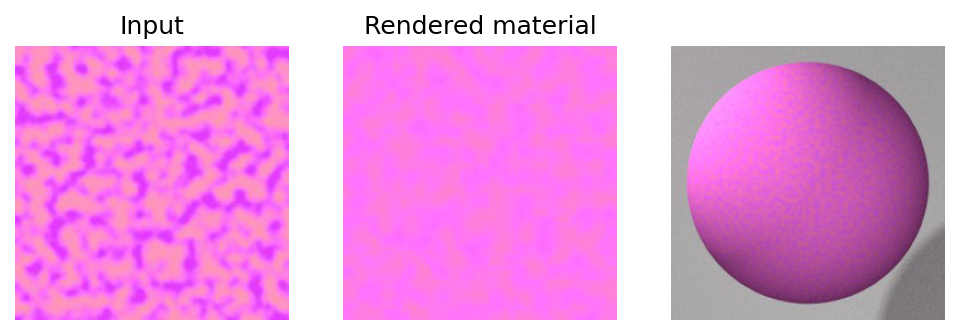


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


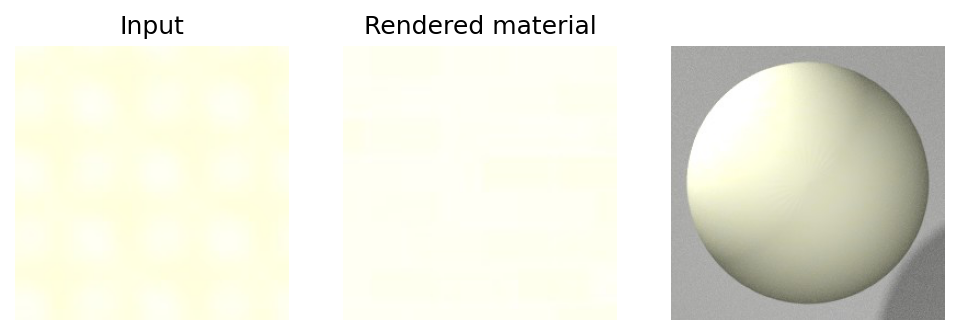


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


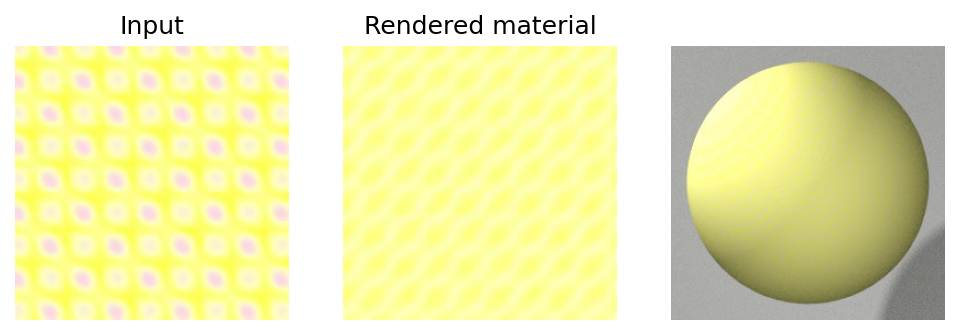


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


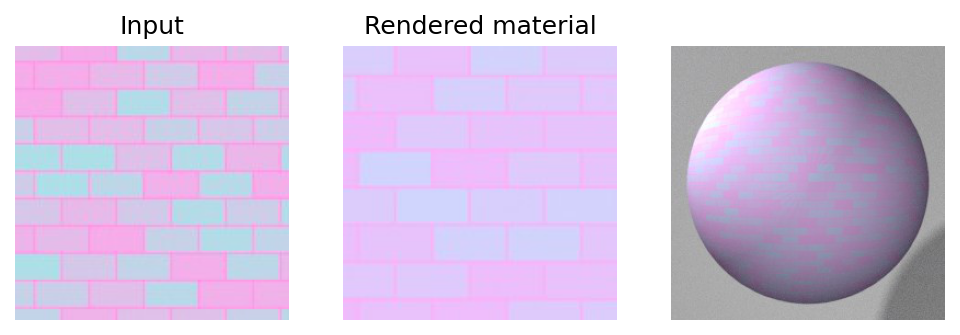


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


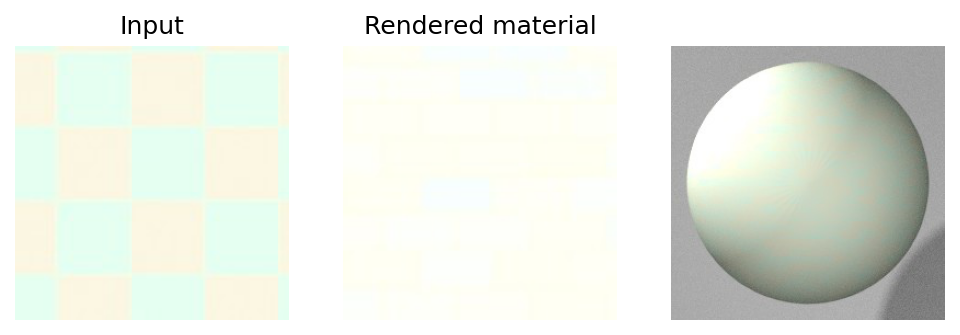


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


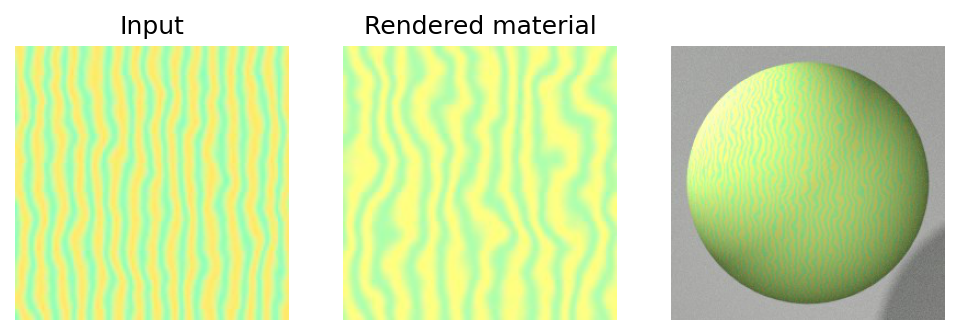


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


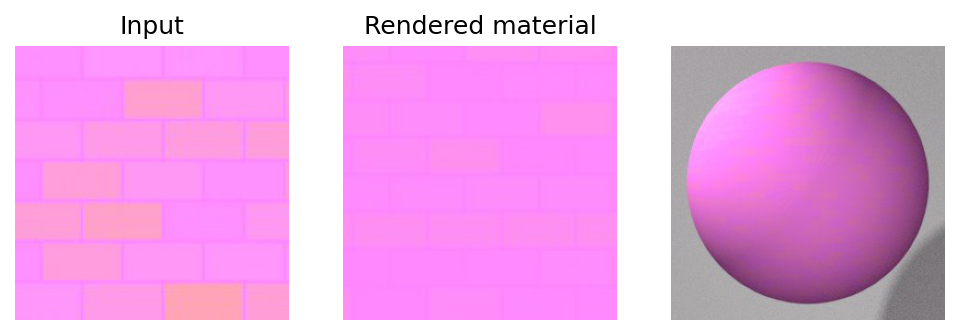


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


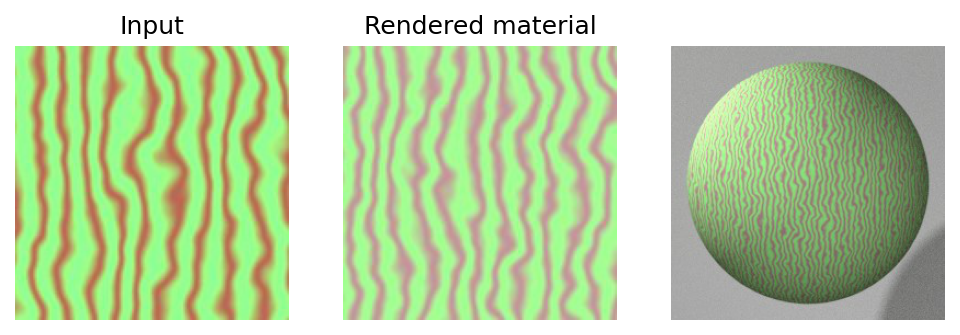


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


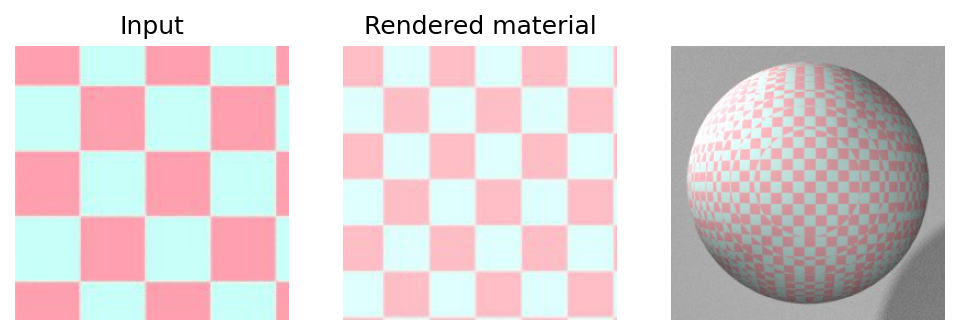


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


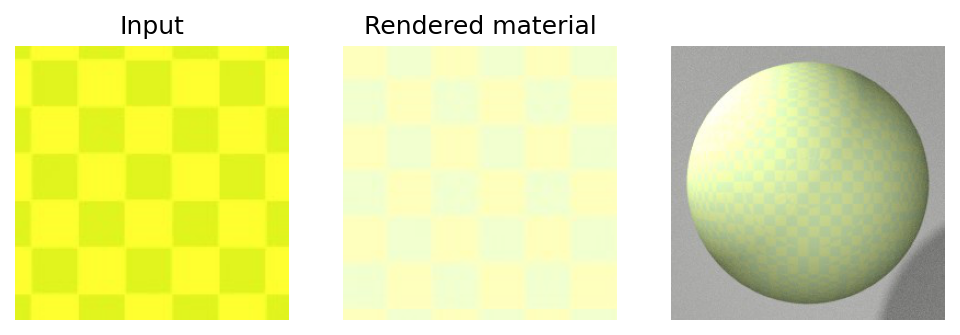


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


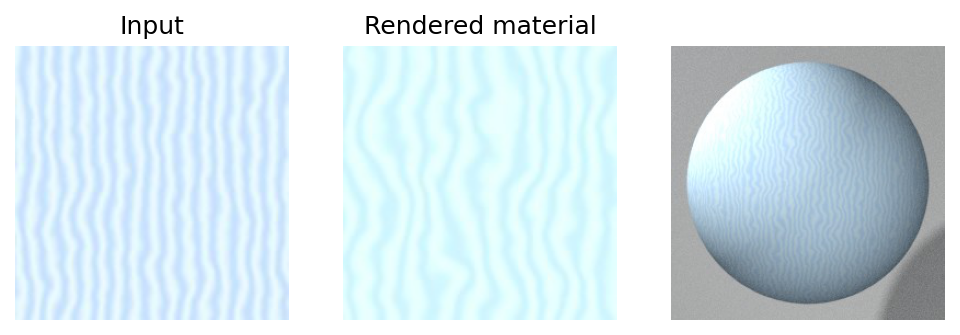


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


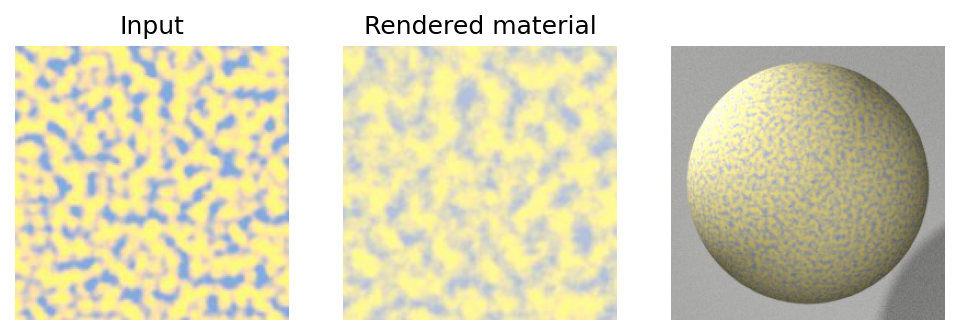


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


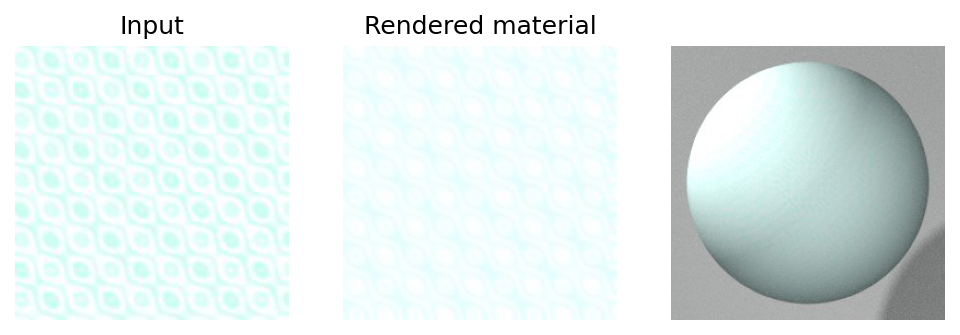


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


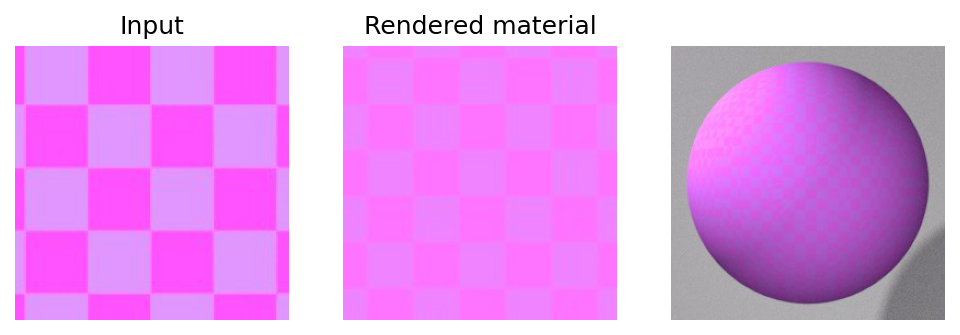


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


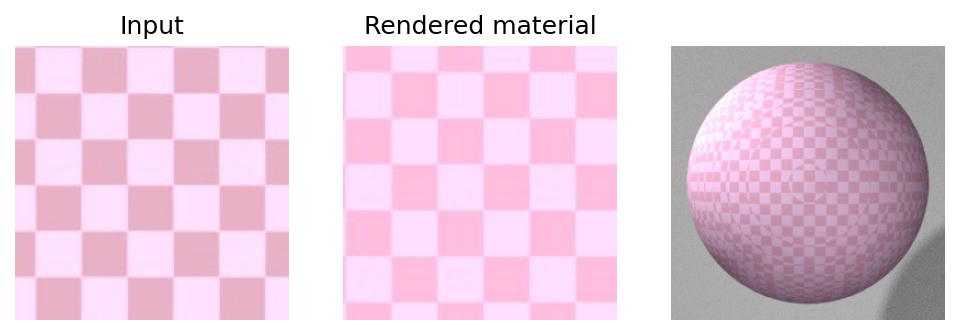


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


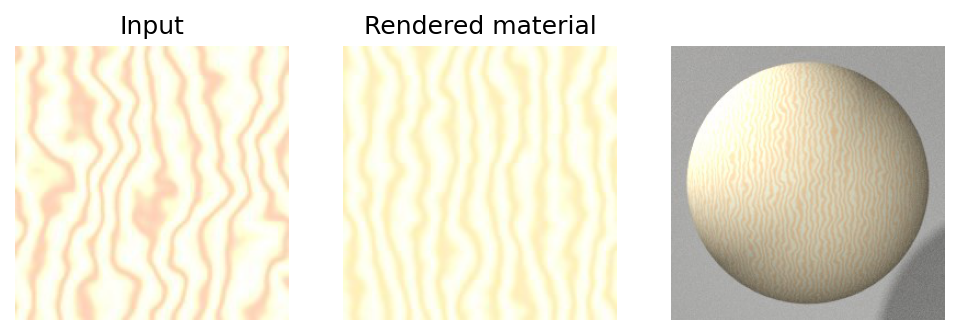


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


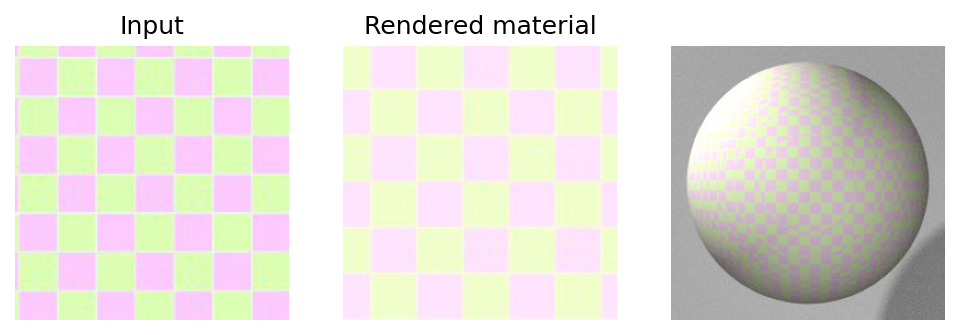


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


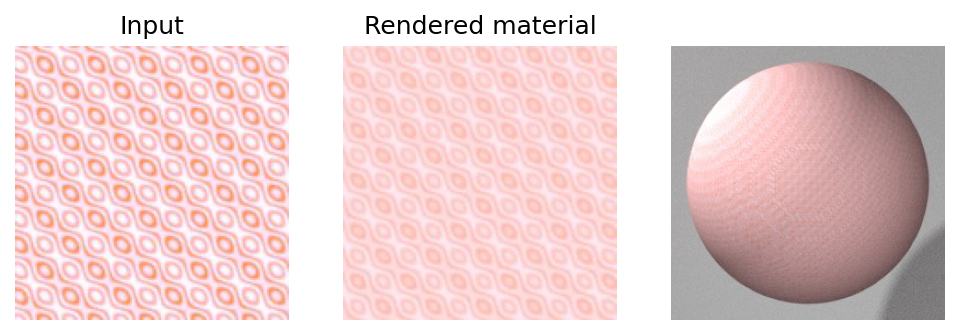


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


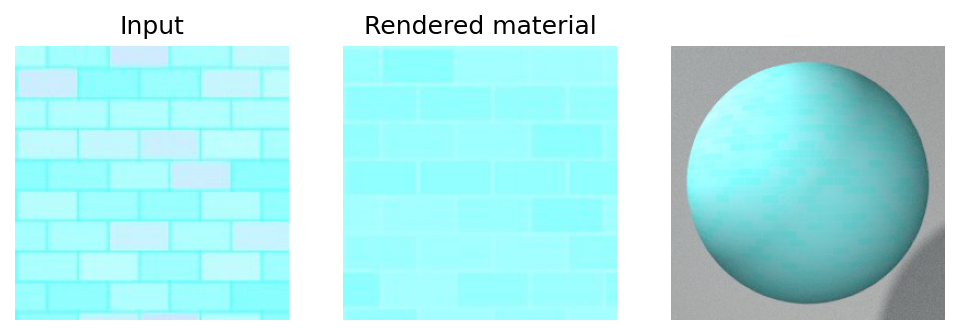


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


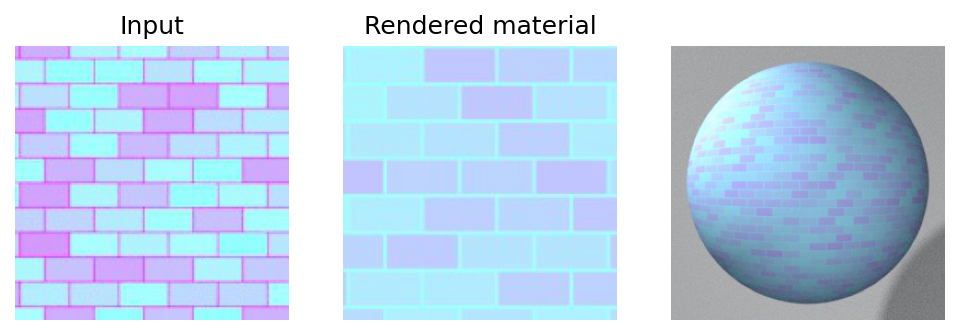


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


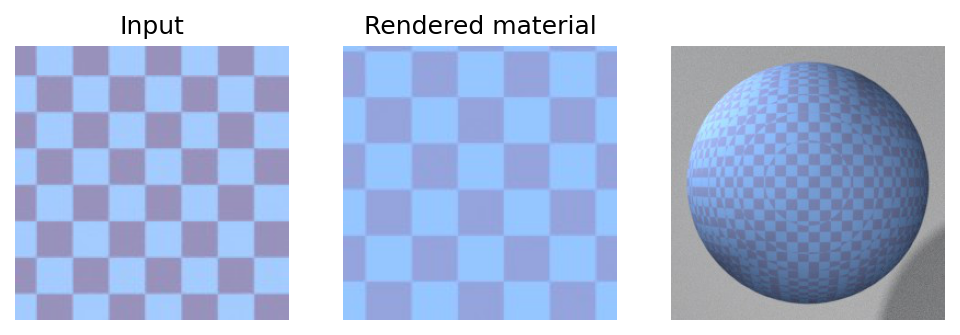


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


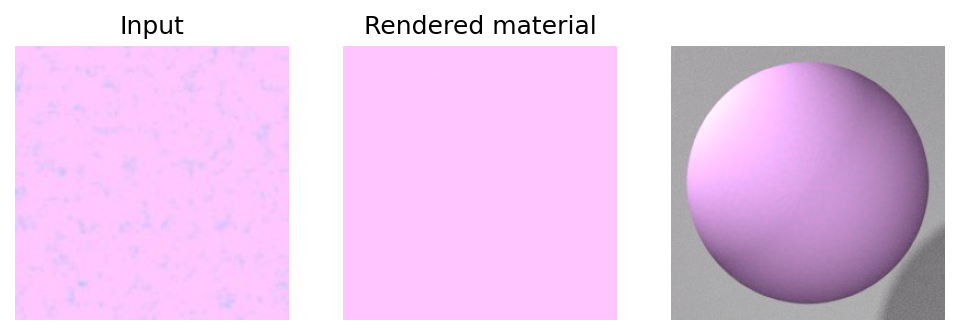


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


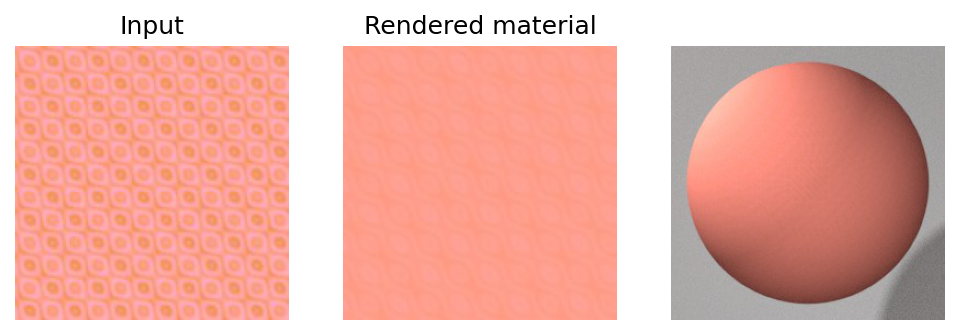


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


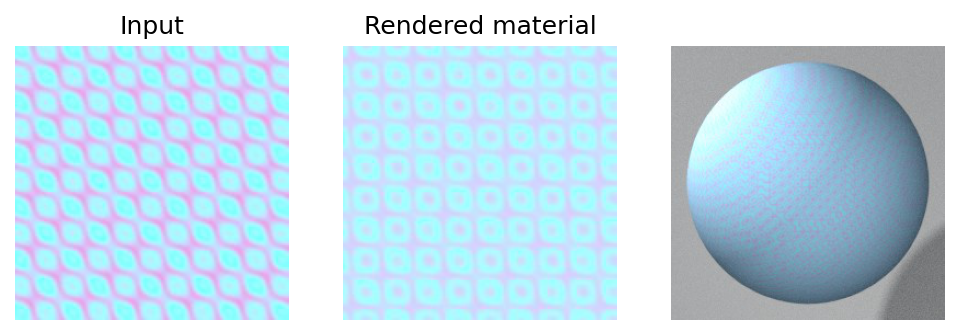


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


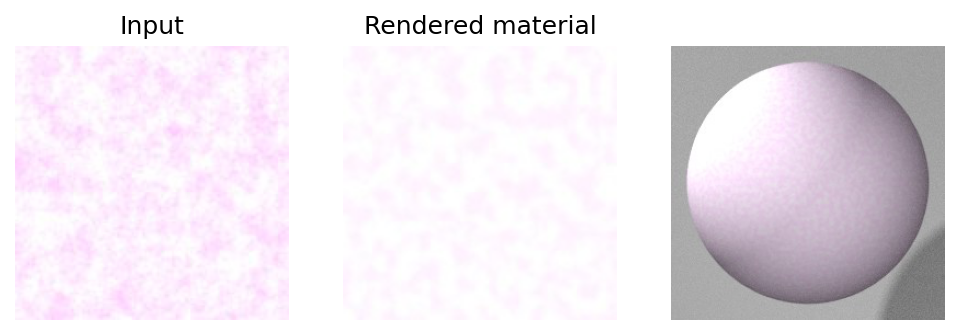


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


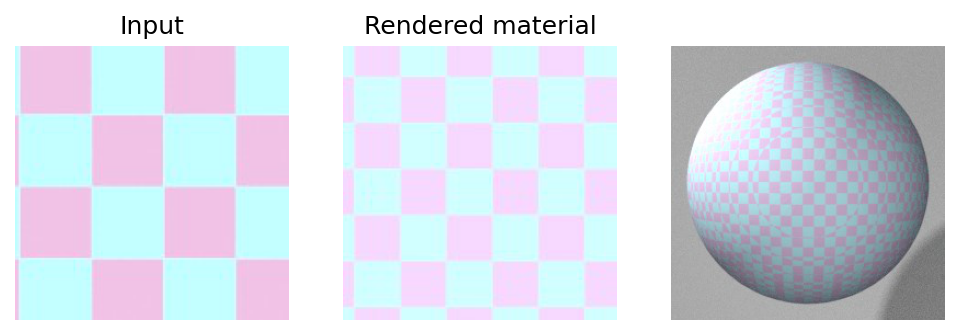


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


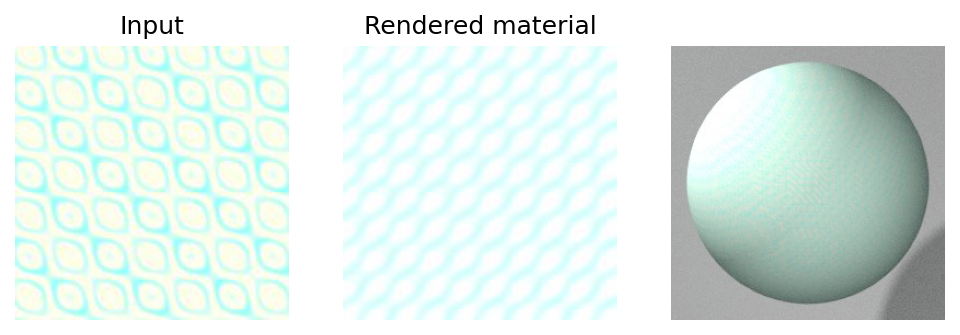


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


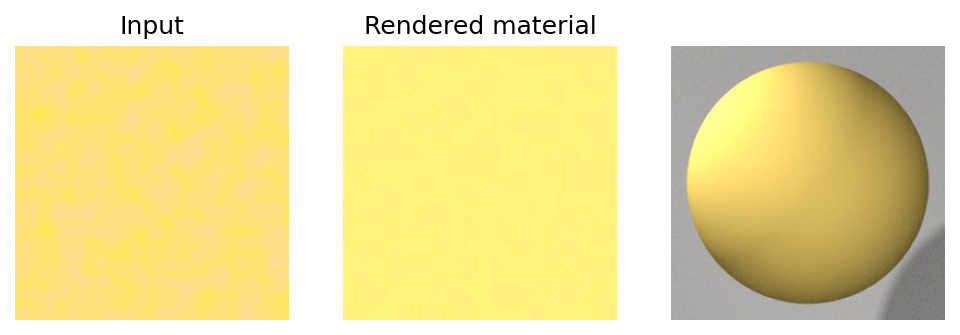


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


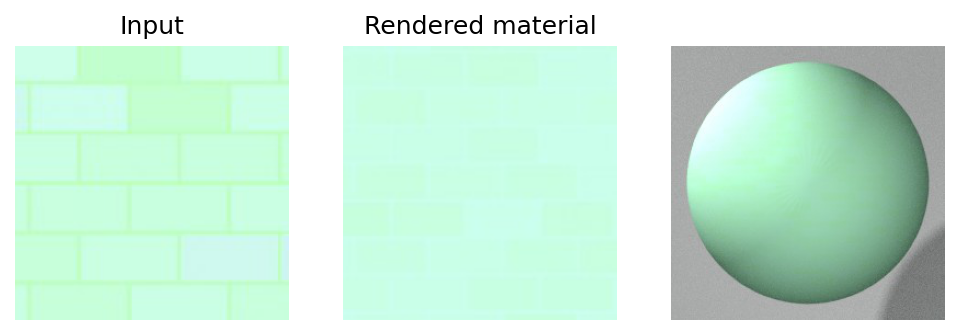


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


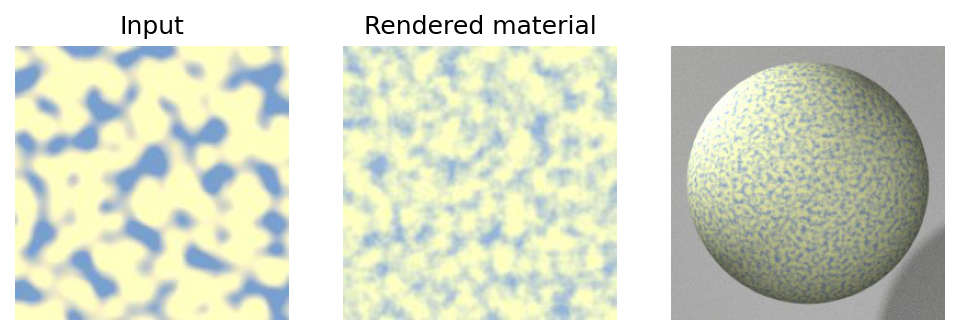


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


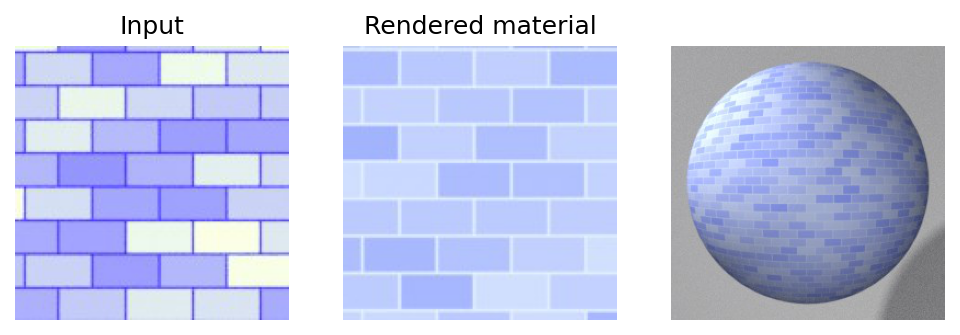


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


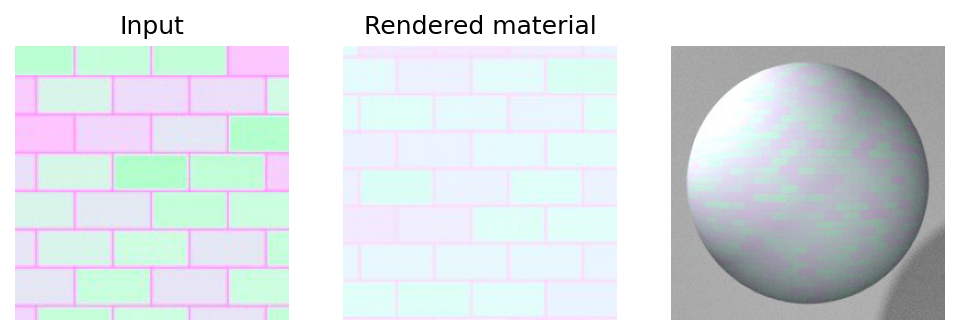


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


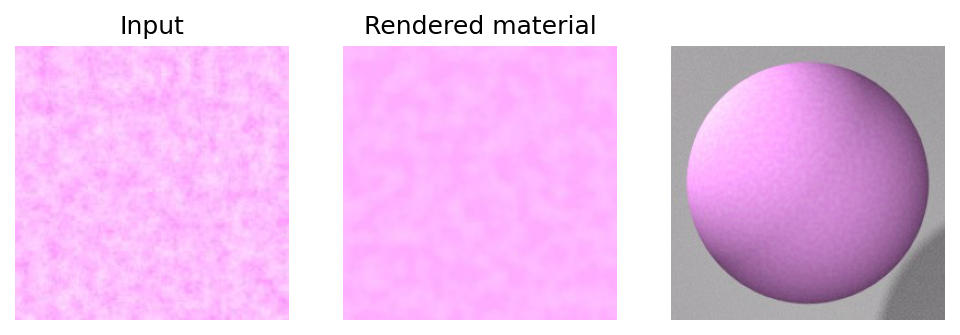


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


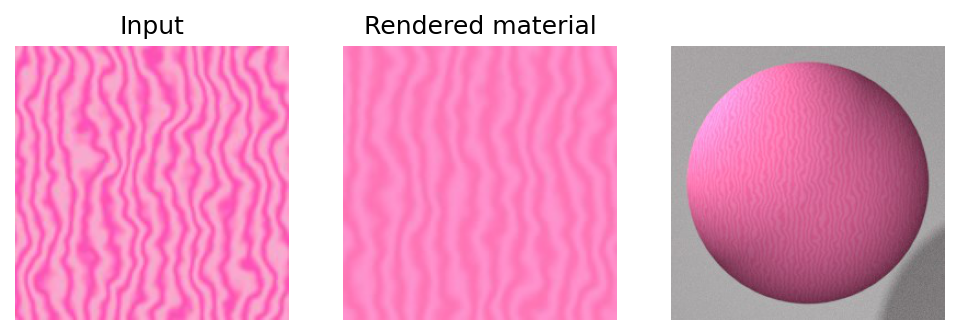


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


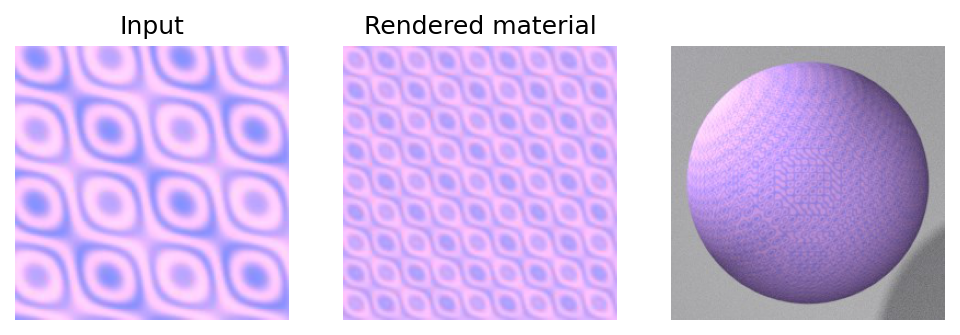


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


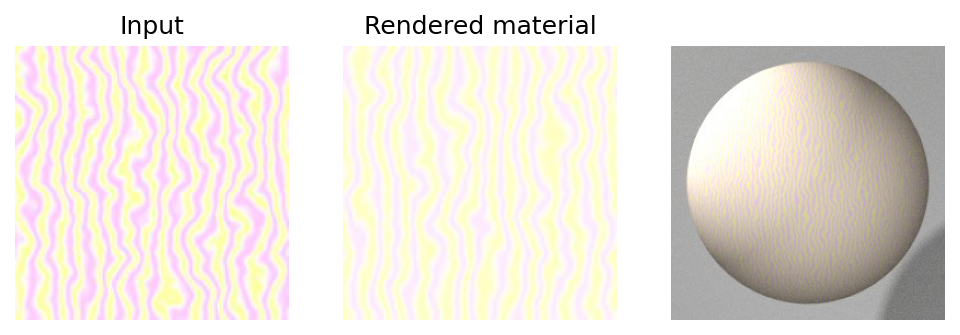


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


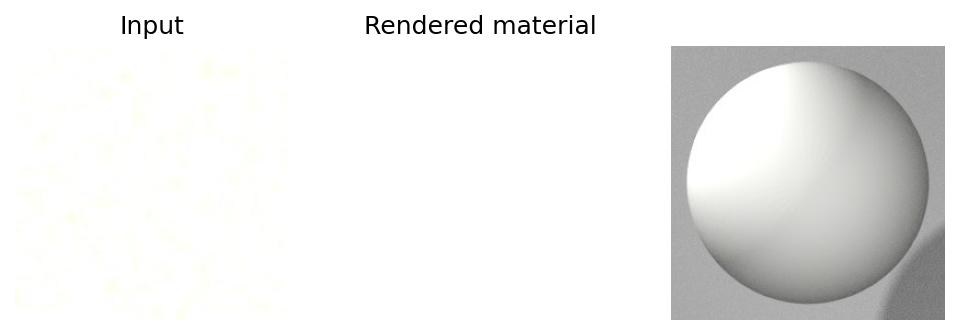


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


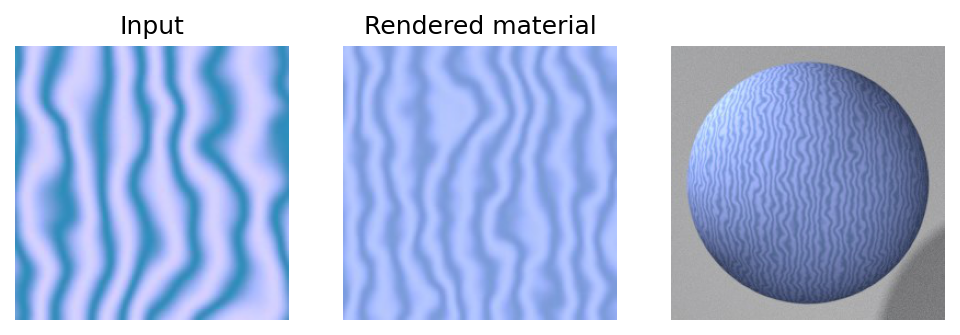


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


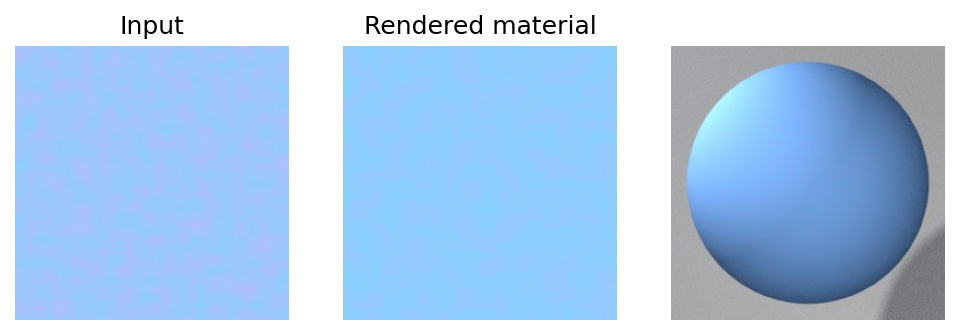


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


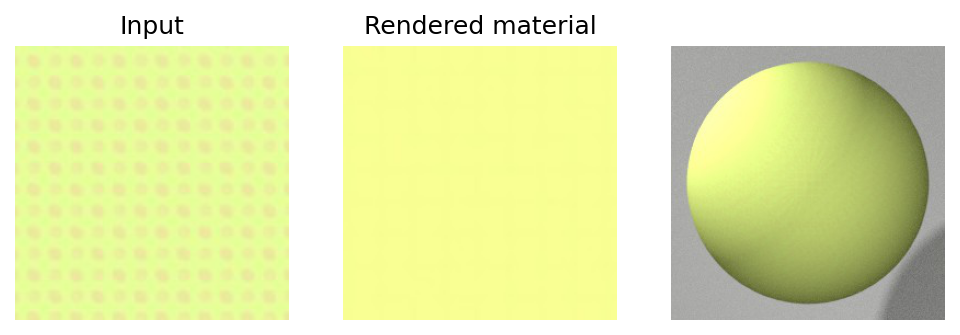


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


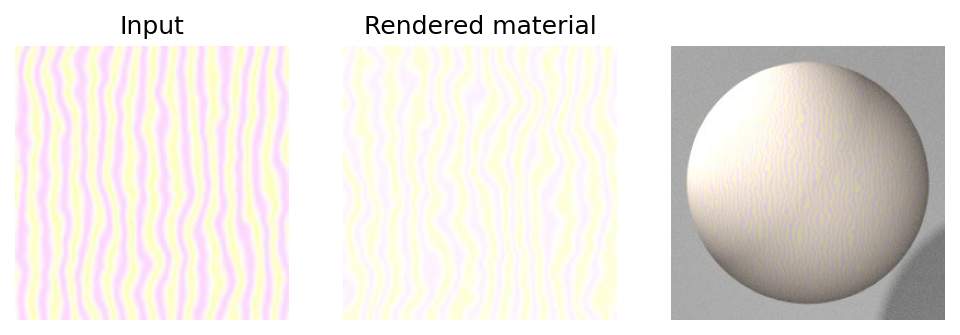


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


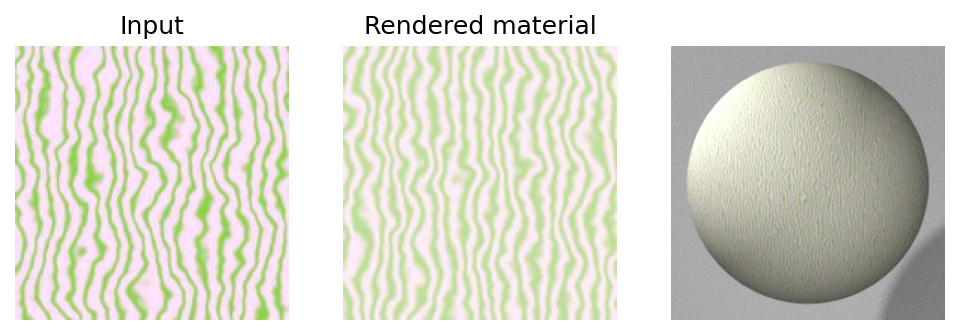


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


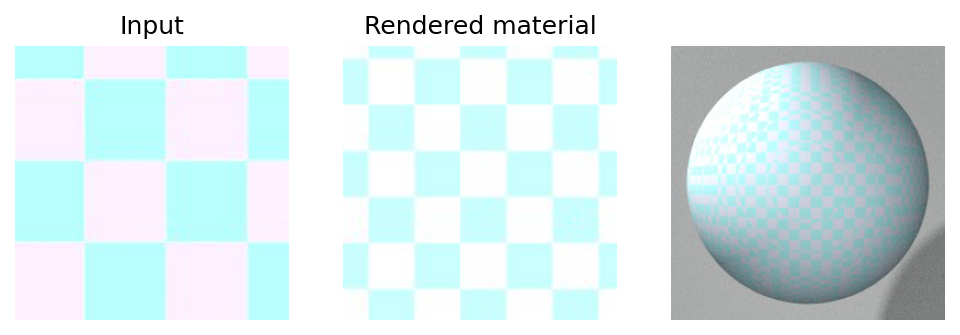


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


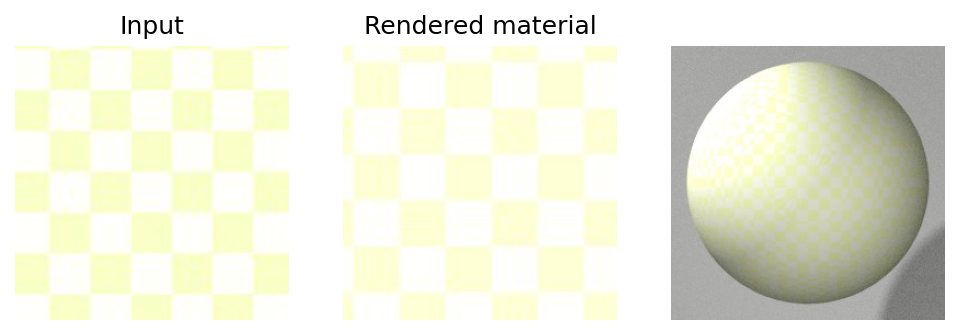


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


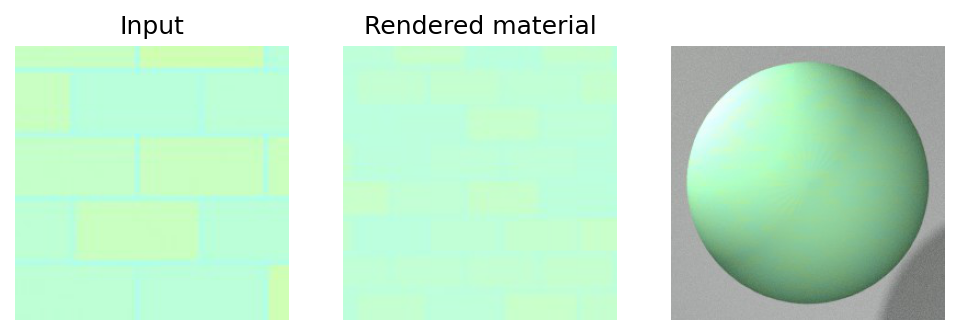


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


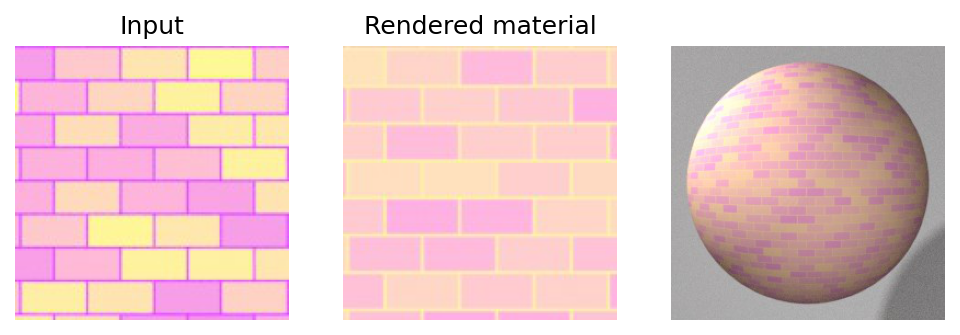


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


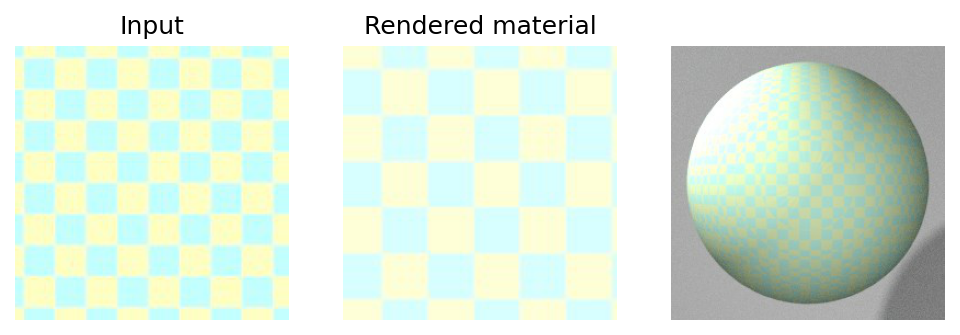


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


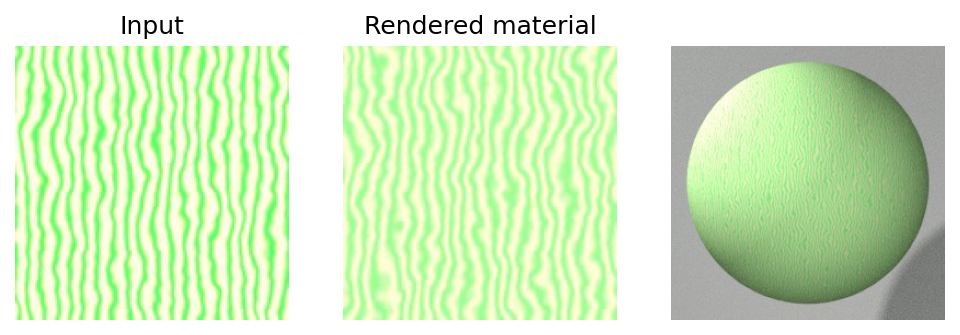


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


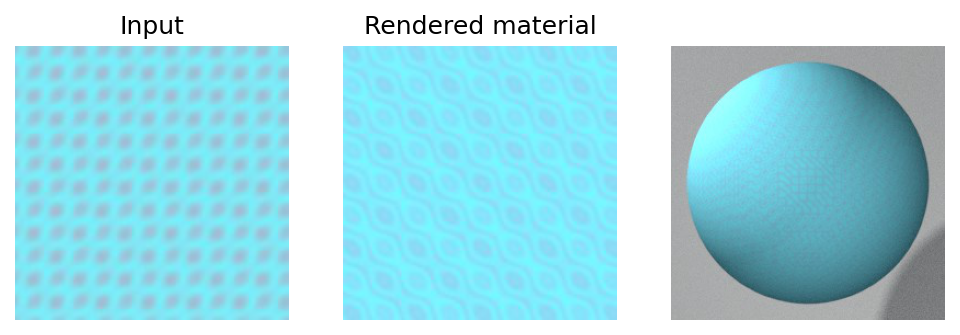


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


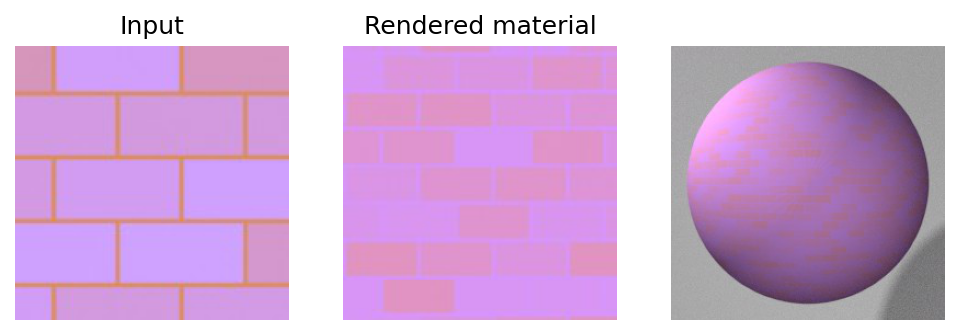

In [32]:
test_gen = MultiDataGenerator(test_root)

t = {0:'Brick', 1:'Checker', 2:'Magic', 3:'Noise', 4:'Wave'}

texture_preds = np.argmax(texture_classifier.predict(test_gen), axis=1)

k = 0

for im, pred in zip(glob.glob(test_root), texture_preds):
    
    test_im = np.array(Image.open(im), dtype=np.uint8)
    
    # Color estimation
    rgb0, rgb1 = extract_primary_colors(test_im, show=False)
    
    # Translate colors
    rgb0 = linear_color_estimator.predict(rgb0[np.newaxis])[0]
    rgb1 = linear_color_estimator.predict(rgb1[np.newaxis])[0]

    # Comput 2-pts correlations
    it = TwoPtsCorrelator().transform(test_im)[np.newaxis]
    
    # Structural parameter estimation
    predicted_texture = t[pred]
    if predicted_texture == 'Brick':
        tex_param = brick_estimator_00.predict(it)[0]       
    elif predicted_texture == 'Checker':
        tex_param = checker_estimator_00.predict(it)[0]
    elif predicted_texture == 'Magic':
        tex_param = magic_estimator_00.predict(it)[0]
    elif predicted_texture == 'Noise':
        tex_param = noise_estimator_00.predict(it)[0]
    elif predicted_texture == 'Wave':
        tex_param = wave_estimator_00.predict(it)[0]
    
    tp = list(tex_param.astype('float'))
    
    # Basic render
    _, root = render_image(
        file='tmp', 
        render_params={
            'width':150,
            'height':150,
            'samples':64,
        },
        material_params={
            'R1':rgb0[0], 'G1':rgb0[1], 'B1':rgb0[2],
            'R2':rgb1[0], 'G2':rgb1[1], 'B2':rgb1[2],
            'glossy_mix':0.0,
            'roughness':0.0,
        },
        texture_params={
            predicted_texture:tp,
        },
        suzanne=False,
    )
    
    test_render = np.array(Image.open(root), dtype=np.uint8)
    
    # Render in scene
    _, root_suzanne = render_image(
        file='tmp', 
        render_params={
            'width':250,
            'height':250,
            'samples':128,
        },
        material_params={
            'R1':rgb0[0], 'G1':rgb0[1], 'B1':rgb0[2],
            'R2':rgb1[0], 'G2':rgb1[1], 'B2':rgb1[2],
            'glossy_mix':0.0,
            'roughness':0.0,
        },
        texture_params={
            predicted_texture:tp,
        },
        suzanne=True,
    )
    
    test_render_suzanne = np.array(Image.open(root_suzanne), dtype=np.uint8)
    
    fig = plt.figure(figsize=(8,4), dpi=150)
    ax = fig.add_subplot(131)
    ax.imshow(test_im)
    ax.set_title('Input')
    ax.axis('off')
    ax = fig.add_subplot(132)
    ax.imshow(test_render)
    ax.axis('off')
    ax.set_title('Rendered material')
    ax = fig.add_subplot(133)
    ax.imshow(test_render_suzanne)
    ax.axis('off')
    plt.show()
    
    k += 1
    if k%1==0:
        break

In [ ]:
# ex = np.vstack((np.linspace(0, 1, 5), np.linspace(0, 1, 5), np.linspace(0, 1, 5)[::-1])).T
# pred = color_estimator.predict(ex)

# for u, v in zip(ex, pred):
#     a = (np.ones((rx, ry))*(u*255)[0])[...,np.newaxis]
#     b = (np.ones((rx, ry))*(u*255)[1])[...,np.newaxis]
#     c = (np.ones((rx, ry))*(u*255)[2])[...,np.newaxis]
#     tm = np.concatenate((a, b, c), axis=2).astype(np.uint8)
#     fig = plt.figure(figsize=(6,2))
#     ax = fig.add_subplot(121)
#     ax.imshow(tm)
#     ax.set_title('example')
#     ax.axis('off')

#     a = (np.ones((rx, ry))*(v*255)[0])[...,np.newaxis]
#     b = (np.ones((rx, ry))*(v*255)[1])[...,np.newaxis]
#     c = (np.ones((rx, ry))*(v*255)[2])[...,np.newaxis]
#     tm = np.concatenate((a, b, c), axis=2).astype(np.uint8)
#     ax = fig.add_subplot(122)
#     ax.imshow(tm)
#     ax.set_title('prediction')
#     ax.axis('off')
#     plt.show()

### Testing color translation

In [ ]:
# ex = np.vstack((np.linspace(0, 1, 5), np.linspace(0, 1, 5), np.linspace(0, 1, 5)[::-1])).T
# pred = color_estimator.predict(ex)

# for u, v in zip(ex, pred):
#     a = (np.ones((rx, ry))*(u*255)[0])[...,np.newaxis]
#     b = (np.ones((rx, ry))*(u*255)[1])[...,np.newaxis]
#     c = (np.ones((rx, ry))*(u*255)[2])[...,np.newaxis]
#     tm = np.concatenate((a, b, c), axis=2).astype(np.uint8)
#     fig = plt.figure(figsize=(6,2))
#     ax = fig.add_subplot(121)
#     ax.imshow(tm)
#     ax.set_title('example')
#     ax.axis('off')

#     a = (np.ones((rx, ry))*(v*255)[0])[...,np.newaxis]
#     b = (np.ones((rx, ry))*(v*255)[1])[...,np.newaxis]
#     c = (np.ones((rx, ry))*(v*255)[2])[...,np.newaxis]
#     tm = np.concatenate((a, b, c), axis=2).astype(np.uint8)
#     ax = fig.add_subplot(122)
#     ax.imshow(tm)
#     ax.set_title('prediction')
#     ax.axis('off')
#     plt.show()

In [ ]:
# preds = model.predict(xte)

# for w, u, v in zip(xte, yte, preds):
#     a = (np.ones((rx, ry))*(u*255)[0])[...,np.newaxis]
#     b = (np.ones((rx, ry))*(u*255)[1])[...,np.newaxis]
#     c = (np.ones((rx, ry))*(u*255)[2])[...,np.newaxis]
#     tm = np.concatenate((a, b, c), axis=2).astype(np.uint8)
#     fig = plt.figure(figsize=(6,2))
#     ax = fig.add_subplot(131)
#     ax.imshow(tm)
#     ax.set_title('yte')
#     ax.axis('off')

#     a = (np.ones((rx, ry))*(v*255)[0])[...,np.newaxis]
#     b = (np.ones((rx, ry))*(v*255)[1])[...,np.newaxis]
#     c = (np.ones((rx, ry))*(v*255)[2])[...,np.newaxis]
#     tm = np.concatenate((a, b, c), axis=2).astype(np.uint8)
#     ax = fig.add_subplot(132)
#     ax.imshow(tm)
#     ax.set_title('pred')
#     ax.axis('off')
    
#     a = (np.ones((rx, ry))*(w*255)[0])[...,np.newaxis]
#     b = (np.ones((rx, ry))*(w*255)[1])[...,np.newaxis]
#     c = (np.ones((rx, ry))*(w*255)[2])[...,np.newaxis]
#     tm = np.concatenate((a, b, c), axis=2).astype(np.uint8)
#     ax = fig.add_subplot(133)
#     ax.imshow(tm)
#     ax.set_title('xte')
#     ax.axis('off')
#     plt.show()

## 5 | Evaluation on real materials

Initialized data generator. Found 10 files.

Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


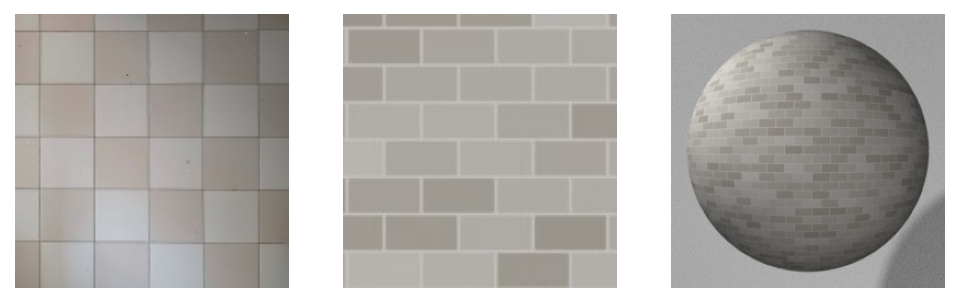


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


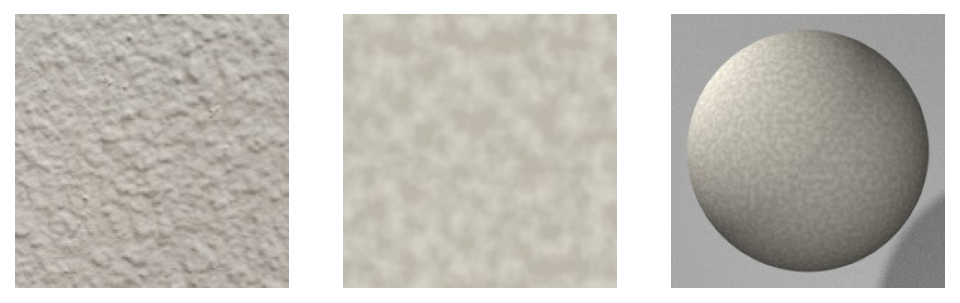


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


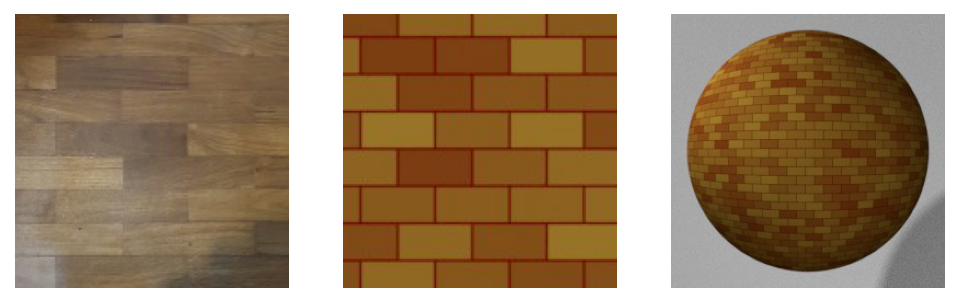


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


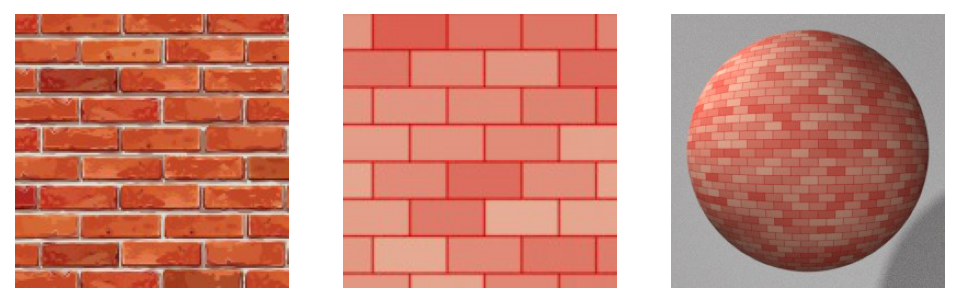


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


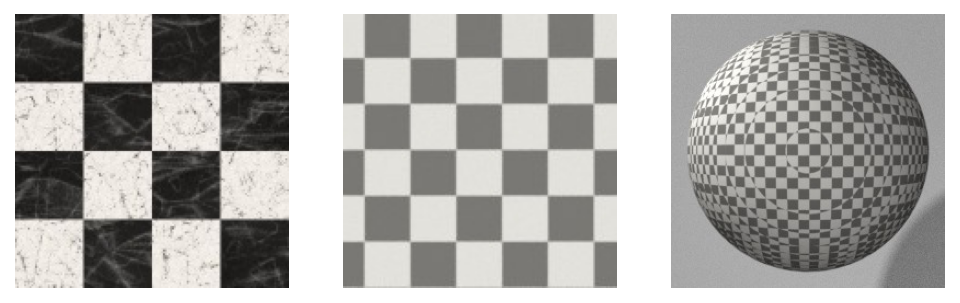


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


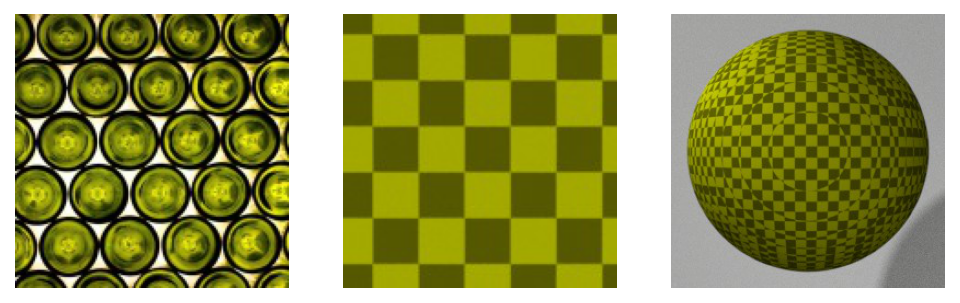


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


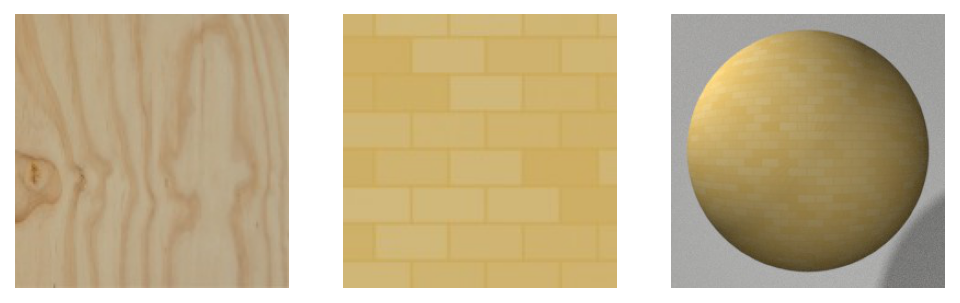


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


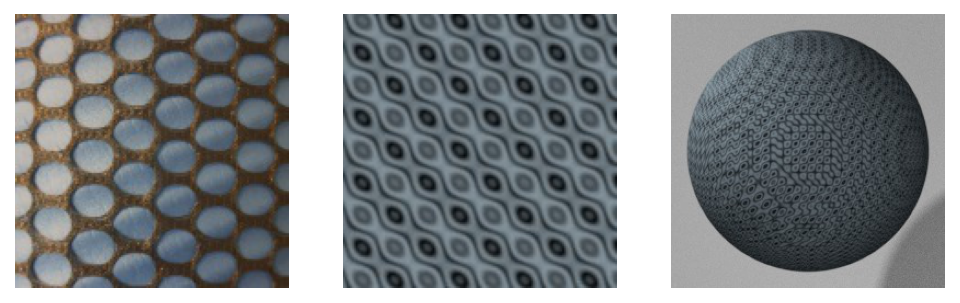


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available
DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


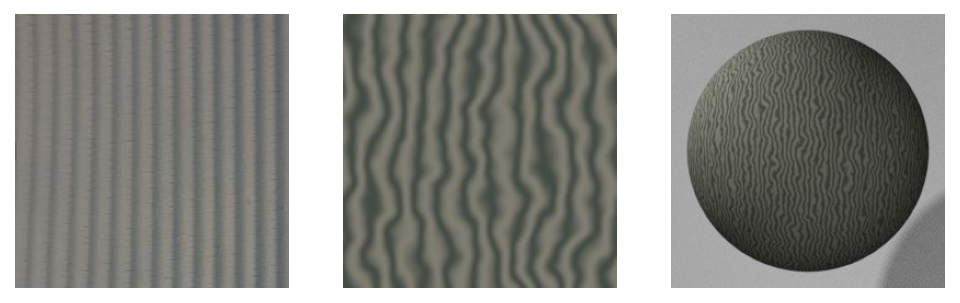


Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available



Blender quit


DEBUG:BlenderGIS-master.core.checkdeps:GDAL Python binding unavailable
DEBUG:BlenderGIS-master.core.checkdeps:PyProj unavailable
DEBUG:BlenderGIS-master.core.checkdeps:Pillow unavailable
DEBUG:BlenderGIS-master.core.checkdeps:ImageIO Freeimage plugin available


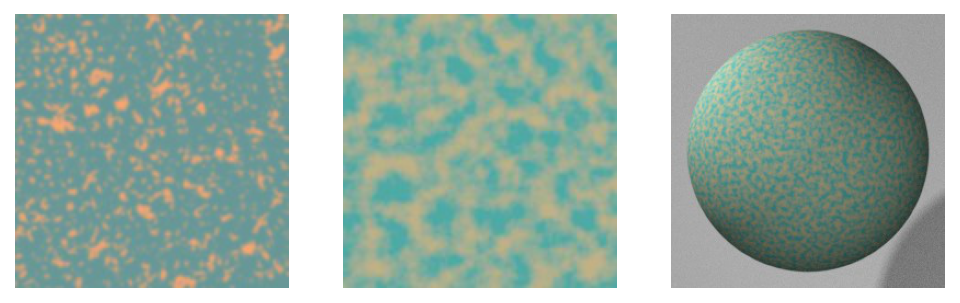

In [47]:
real_gen = RealImagesGenerator(real_root)   

t = {0:'Brick', 1:'Checker', 2:'Magic', 3:'Noise', 4:'Wave'}

texture_preds = np.argmax(texture_classifier.predict(real_gen), axis=1)

for im, pred in zip(glob.glob(real_root), texture_preds):
    
    test_im = np.array(Image.open(im), dtype=np.uint8)

    rgb0, rgb1 = extract_primary_colors(test_im)
    
    rgb0 = linear_color_estimator.predict(rgb0[np.newaxis])[0]
    rgb1 = linear_color_estimator.predict(rgb1[np.newaxis])[0]
    
    # Comput 2-pts correlations
    it = TwoPtsCorrelator().transform(test_im)[np.newaxis]
    
    predicted_texture = t[pred]
    if predicted_texture == 'Brick':
        tex_param = brick_estimator_00.predict(it)[0]       
    elif predicted_texture == 'Checker':
        tex_param = checker_estimator_00.predict(it)[0]
    elif predicted_texture == 'Magic':
        tex_param = magic_estimator_00.predict(it)[0]
    elif predicted_texture == 'Noise':
        tex_param = noise_estimator_00.predict(it)[0]
    elif predicted_texture == 'Wave':
        tex_param = wave_estimator_00.predict(it)[0]
    
    # Basic render
    _, root = render_image(
        file='tmp', 
        render_params={
            'width':150,
            'height':150,
            'samples':64,
        },
        material_params={
            'R1':rgb0[0], 'G1':rgb0[1], 'B1':rgb0[2],
            'R2':rgb1[0], 'G2':rgb1[1], 'B2':rgb1[2],
            'glossy_mix':0.0,
            'roughness':0.0,
        },
        texture_params={
            predicted_texture:tp,
        },
        suzanne=False,
    )
    
    test_render = np.array(Image.open(root), dtype=np.uint8)
    
    # Render in scene
    _, root_suzanne = render_image(
        file='tmp', 
        render_params={
            'width':250,
            'height':250,
            'samples':128,
        },
        material_params={
            'R1':rgb0[0], 'G1':rgb0[1], 'B1':rgb0[2],
            'R2':rgb1[0], 'G2':rgb1[1], 'B2':rgb1[2],
            'glossy_mix':0.0,
            'roughness':0.0,
        },
        texture_params={
            predicted_texture:tp,
        },
        suzanne=True,
    )
    
    test_render_suzanne = np.array(Image.open(root_suzanne), dtype=np.uint8)
    
    fig = plt.figure(figsize=(8,4), dpi=150)
    ax = fig.add_subplot(131)
    ax.imshow(test_im)
#     ax.set_title('Input')
    ax.axis('off')
    ax = fig.add_subplot(132)
    ax.imshow(test_render)
    ax.axis('off')
#     ax.set_title('Rendered material')
    ax = fig.add_subplot(133)
    ax.imshow(test_render_suzanne)
    ax.axis('off')
    plt.show()